In [37]:
# import relevant libraries

import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns

import warnings

In [ ]:
# set options

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [422]:
# read the two datasets of 2019 - Open Athletes & Open Scores

df_19_ath = pd.read_csv('./data/2019_opens_athletes.csv')
df_19_sco = pd.read_csv('./data/2019_opens_scores.csv')

In [6]:
df_19_ath.head()

,competitorid,competitorname,firstname,lastname,postcompstatus,gender,profilepics3key,countryoforigincode,countryoforiginname,divisionid,affiliateid,affiliatename,age,height,weight,overallrank,overallscore,is_scaled,division
0,2536,Samantha Briggs,Samantha,Briggs,accepted,F,0e63d-P2536_14-184.jpg,GB,United Kingdom,19,4098,CrossFit Black Five,37,1.70,61.23,1,33,0,Women (35-39)
1,485089,Renata Pimentel,Renata,Pimentel,accepted,F,04e97-P485089_5-184.jpg,BR,Brazil,19,15868,CrossFit Gurkha,36,1.74,73.00,2,66,0,Women (35-39)
2,16973,Carleen Mathews,Carleen,Mathews,NaN,F,b663a-P16973_6-184.jpg,US,United States,19,10471,CrossFit Saint Helens,35,1.57,62.14,3,101,0,Women (35-39)
3,751083,Danila Capaccetti,Danila,Capaccetti,NaN,F,pukie.png,IT,Italy,19,9329,CrossFit Black Shark,35,1.70,71.00,4,139,0,Women (35-39)
4,313257,Hope Cicero,Hope,Cicero,NaN,F,f204b-P313257_1-184.jpg,US,United States,19,438,CrossFit Billings,36,1.55,61.23,5,176,0,Women (35-39)


* some features may be neglected (?):
  - competitorname
  - firstname
  - lastname
  - postcompstatus
  - profilepics3key
  - countryoforigincode (name already exists)
  - affiliatename (affiliateid has the same information)
* has divisionid same information as division? --> no, seem to differ
* we need competitorid to combine both dataframes later

In [13]:
df_19_sco.head()

,affiliate,breakdown,competitorid,division,is_scaled,judge,ordinal,rank,scaled,score,scoredisplay,scoreidentifier,time
0,CrossFit RDU,9 rounds +\n10 wall-ball shots\n,96511,Men (45-49),0,Erin Miller,1,1,0,13520000,352 reps,27f30f9a8c0a564ae799,NaN
1,CrossFit RDU,Within 16 minutes:\n3 rounds +\n25 toes-to-bar...,96511,Men (45-49),0,Harper Thorsen,2,4,0,13420368,342 reps,0ed3d1264f25a8f1890d,NaN
2,CrossFit RDU,200-ft. OH lunge\n50 box step-ups\n50 strict H...,96511,Men (45-49),0,Harper Thorsen,3,1,0,11800018,9:42,f2a143399a330c95321b,582.0
3,CrossFit RDU,132 reps\n6 rounds,96511,Men (45-49),0,Harper Thorsen,4,36,0,11320009,11:51,89101e401c6c85997363,711.0
4,CrossFit RDU,210 reps,96511,Men (45-49),0,Harper Thorsen,5,1,0,12100573,10:27,f7588c9174f1fe90f5c4,627.0


* what is scoreidentifier?

In [96]:
df_19_ath.shape

(572653, 19)

In [9]:
df_19_sco.shape

(2863265, 13)

* 572,653 athletes with 5 competition workouts per athlete results in 2,863,265 scores observations

In [5]:
df_19_ath.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 572653 entries, 0 to 572652
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   competitorid         572653 non-null  int64  
 1   competitorname       572653 non-null  object 
 2   firstname            572653 non-null  object 
 3   lastname             572653 non-null  object 
 4   postcompstatus       302 non-null     object 
 5   gender               572653 non-null  object 
 6   profilepics3key      572653 non-null  object 
 7   countryoforigincode  572348 non-null  object 
 8   countryoforiginname  572653 non-null  object 
 9   divisionid           572653 non-null  int64  
 10  affiliateid          572653 non-null  int64  
 11  affiliatename        540821 non-null  object 
 12  age                  572653 non-null  int64  
 13  height               304823 non-null  float64
 14  weight               323754 non-null  float64
 15  overallrank      

* height and weight has many missing values

In [10]:
df_19_sco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2863265 entries, 0 to 2863264
Data columns (total 13 columns):
 #   Column           Dtype  
---  ------           -----  
 0   affiliate        object 
 1   breakdown        object 
 2   competitorid     int64  
 3   division         object 
 4   is_scaled        int64  
 5   judge            object 
 6   ordinal          int64  
 7   rank             int64  
 8   scaled           int64  
 9   score            int64  
 10  scoredisplay     object 
 11  scoreidentifier  object 
 12  time             float64
dtypes: float64(1), int64(6), object(6)
memory usage: 284.0+ MB


In [17]:
profile_ath = ProfileReport(df_19_ath, title="Pandas Profiling Report", explorative=True)
profile_ath

Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* 19 features; 8 numeric and 11 categorical
* 10,3 % missing cells
* no duplicate rows
* memory size 380 MB
* high correlations:
  - overallrank & overallscore --> drop overallrank
  - postcompstatus & is_scaled --> drop one & what is postcompstatus?
  - division & gender --> cleaning gender information in division
* missing values:
  - postcompstatus with just missing values --> drop features
  - affiliateid & affiliatename with 5.6 % missing values --> athletes with no affiliate --> rename it
* have a deeper look at profilepics3key --> no information, just name of picture in profile
* 157 different countries --> groupby regions
* countryoforigincode equals contryoforignname --> drop one
* have a deeper look at divisionid
* affiliateid with many zeros --> athletes with no affiliate --> rename it
* affiliatename equals affiliateid (redundant information) --> drop one
* age: maximum values make no sense; drop outliers
* height:
  - almost half of values missing
  - what to do with missing data?
  - extreme values make no sense
  - drop outliers
  - high skewness
  - have a deeper look at distribution and units (US/GB & metric differences)
* weight:
  - almost half of values missing
  - what to do with missing data?
  - extreme values make no sense
  - drop outliers
  - high skewness
  - have a deeper look at distribution and units (US/GB & metric differences)
* comparing heights & weights of athletes
* check how many athletes participated in each competition (have a deeper look)

In [18]:
profile_sco = ProfileReport(df_19_sco, title="Pandas Profiling Report", explorative=True)
profile_sco

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

* 13 features, 9 categorical & 4 numerical
* 14.7 % missing cells
* no duplicate rows
* memory size 1.2 GB
* missing values:
  - affiliate 21.1 % --> take affiliates from athletes dataset
  - breakdown 18.7 % --> have a deeper look; check if athlete participated
  - judge 21.1 % --> drop it
  - scoredisplay 18.6 % --> have a deeper look, seems not useful and drop it (same with scoreidentifier)
  - scoreidentifier 18.6 % --> drop it
  - time 93.2 % --> have a deeper look; often time is not relevant
* what is scoreidentifier?
* score with 18.6 % zeros --> check if athlete participated (see breakdown)
* breakdown with most important information regarding reps/time per exercise
* competitiorid: strange distribution --> have a deeper look
* have a deeper look at ordinal
* rank same as in athlete dataframe --> drop it
* score:
  - 18.6 % zeros --> athletes not competing? (same as in breakdown, scoredisplay & scoreidentifier)
  - two distinct distributions identified
  - have a deeper look
* time distribution shows two different distributions --> have a deeper look

### ath: divisionid same as division?

In [24]:
# number of unique values seem to differ (different amount of categories)
print('division: ', df_19_ath.division.unique())
print('divisionid: ', df_19_ath.divisionid.unique())

division:  ['Women (35-39)' 'Women' 'Women (40-44)' 'Women (60+)' 'Men (50-54)'
 'Women (50-54)' 'Men' 'Women (55-59)' 'Men (60+)' 'Men (55-59)'
 'Men (45-49)' 'Men (40-44)' 'Men (35-39)' 'Women (45-49)']
divisionid:  [19  2 13 17  4  6 10  5  1 18 12 16  3  8  9  7]


In [35]:
pd.crosstab(df_19_ath.gender, df_19_ath.division)

division,Men,Men (35-39),Men (40-44),Men (45-49),Men (50-54),Men (55-59),Men (60+),Women,Women (35-39),Women (40-44),Women (45-49),Women (50-54),Women (55-59),Women (60+)
gender,,,,,,,,,,,,,,
F,0,0,0,0,0,0,0,172687,31934,21452,13632,7972,4560,3185
M,210150,42248,28384,17894,9476,5247,3832,0,0,0,0,0,0,0


In [36]:
pd.crosstab(df_19_ath.gender, df_19_ath.divisionid)

divisionid,1,2,3,4,5,6,7,8,9,10,12,13,16,17,18,19
gender,,,,,,,,,,,,,,,,
F,0,95228,0,27264,0,15944,0,4560,0,3185,0,42904,0,2469,0,63868
M,109376,0,35786,0,18952,0,5247,0,3832,0,56760,0,2745,0,84533,0


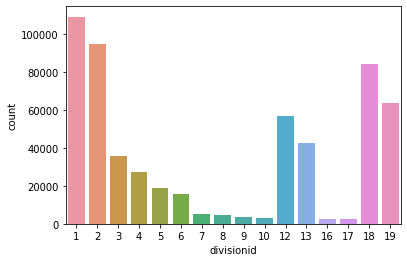

In [44]:
sns.countplot(data=df_19_ath, x='divisionid');

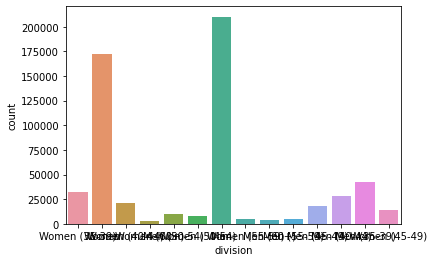

In [45]:
sns.countplot(data=df_19_ath, x='division');

In [42]:
# what about boys and girls division?

#### --> seems to be different

### Check missing values of height and weight

In [70]:
print('height NaN: ', df_19_ath['height'].isna().sum())
print('weight NaN: ', df_19_ath['weight'].isna().sum())
print('both NaN  : ', (df_19_ath['height'].isna() & df_19_ath['weight'].isna()).sum())

height NaN:  267830
weight NaN:  248899
both NaN  :  235621


In [71]:
pd.crosstab(df_19_ath.gender, (df_19_ath['height'].isna() & df_19_ath['weight'].isna()))

col_0,False,True
gender,,
F,122143,133279
M,214889,102342


#### --> both M and F have missing values in height and weight, most missing heights and weights belong to same athlete

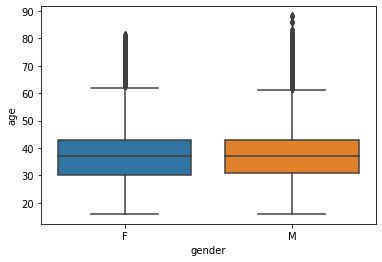

In [138]:
sns.boxplot(data=df_19_ath[df_19_ath['age']<100], y='age', x='gender'); # drop max values (e.g. above 99 years)

### Check weights and heights

In [128]:
print('<  1: ', df_19_ath[df_19_ath['weight']<1.0].weight.count())
print('< 10: ', df_19_ath[df_19_ath['weight']<10.0].weight.count())
print('< 20: ', df_19_ath[df_19_ath['weight']<20.0].weight.count())
print('< 30: ', df_19_ath[df_19_ath['weight']<30.0].weight.count())
print('< 40: ', df_19_ath[df_19_ath['weight']<40.0].weight.count())
print()
print('> 500: ', df_19_ath[df_19_ath['weight']>500.0].weight.count())
print('> 200: ', df_19_ath[df_19_ath['weight']>300.0].weight.count())
print('> 100: ', df_19_ath[df_19_ath['weight']>100.0].weight.count())

<  1:  86
< 10:  256
< 20:  275
< 30:  721
< 40:  1623

> 500:  31
> 200:  36
> 100:  22761


In [136]:
print('<  1.0: ', df_19_ath[df_19_ath['height']<1.0].height.count())
print('<  1.5: ', df_19_ath[df_19_ath['height']<1.5].height.count())
print()
print('>  2.2: ', df_19_ath[df_19_ath['height']>2.2].height.count())
print('>  3.0: ', df_19_ath[df_19_ath['height']>3.0].height.count())
print()
print('>  150: ', df_19_ath[df_19_ath['height']>150].height.count())
print('>  220: ', df_19_ath[df_19_ath['height']>220].height.count())

<  1.0:  4183
<  1.5:  4972

>  2.2:  1154
>  3.0:  1132

>  150:  13
>  220:  7


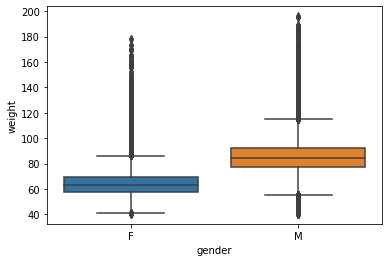

In [149]:
sns.boxplot(data=df_19_ath.loc[(df_19_ath['weight']>40) & (df_19_ath['weight']<200)], y='weight', x='gender');

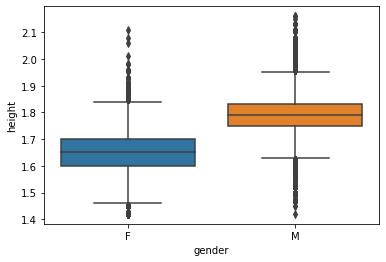

In [151]:
sns.boxplot(data=df_19_ath.loc[(df_19_ath['height']>1.4) & (df_19_ath['height']<2.2)], y='height', x='gender');

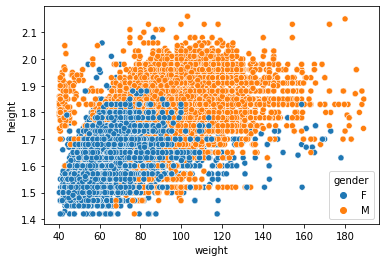

In [152]:
sns.scatterplot(
    data=df_19_ath.loc[(df_19_ath['height']>1.4) & (df_19_ath['height']<2.2) & (df_19_ath['weight']>40) & (df_19_ath['weight']<200)],
    x='weight', y='height', hue='gender');

In [153]:
# weight and height distribution makes no sense at the moment
# declare outliers of weight (senseless values and 1.0) and height as missing values
# declare missing values as 0 (or something else significant)
# check for a "normal" BMI
# take data from athletes benchmark stats?

### scaled vs is_scaled?

In [284]:
df_19_ath[df_19_ath['lastname']=='Jenek'] # my id: 1580961

,competitorid,competitorname,firstname,lastname,postcompstatus,gender,profilepics3key,countryoforigincode,countryoforiginname,divisionid,affiliateid,affiliatename,age,height,weight,overallrank,overallscore,is_scaled,division
356986,1580961,Julius Jenek,Julius,Jenek,NaN,M,pukie.png,DE,Germany,1,14893,CrossFit Sheep Pack,30,NaN,NaN,110331,537883,0,Men


In [285]:
df_19_sco[df_19_sco['competitorid']==1580961]

,affiliate,breakdown,competitorid,division,is_scaled,judge,ordinal,rank,scaled,score,scoredisplay,scoreidentifier,time
2190560,CrossFit Sheep Pack,6 rounds +\n7 wall-ball shots\n,1580961,Men,0,Alfonso,1,96350,0,12350000,235 reps,27c93be69bbbd139842c,NaN
2190561,CrossFit Sheep Pack,Within 12 minutes:\n2 rounds +\n25 knee-raises...,1580961,Men,0,Cati,2,148221,1,2570540,257 reps - s,e5843943fe4fd4e5760b,NaN
2190562,CrossFit Sheep Pack,200-ft. OH lunge\n50 box step-ups\n7 strict HS...,1580961,Men,0,Olaf Zorn,3,64496,0,10970062,97 reps,05db39d7e9194303f8cc,NaN
2190563,CrossFit Sheep Pack,3 rounds +\n3 bar MUs\nTiebreak: 5:40,1580961,Men,0,Olaf Zorn,4,91433,0,10690380,69 reps,1771a3644367e658b30c,NaN
2190564,NaN,NaN,1580961,Men,0,NaN,5,137383,0,0,NaN,NaN,NaN


### --> scaled stands for scaling each workout and is_scaled is the overall status

### reshaping of score dataframe (each athlete with one row)

In [321]:
df_19_sco.head(10)

,affiliate,breakdown,competitorid,division,is_scaled,judge,ordinal,rank,scaled,score,scoredisplay,scoreidentifier,time
0,CrossFit RDU,9 rounds +\n10 wall-ball shots\n,96511,Men (45-49),0,Erin Miller,1,1,0,13520000,352 reps,27f30f9a8c0a564ae799,NaN
1,CrossFit RDU,Within 16 minutes:\n3 rounds +\n25 toes-to-bar...,96511,Men (45-49),0,Harper Thorsen,2,4,0,13420368,342 reps,0ed3d1264f25a8f1890d,NaN
2,CrossFit RDU,200-ft. OH lunge\n50 box step-ups\n50 strict H...,96511,Men (45-49),0,Harper Thorsen,3,1,0,11800018,9:42,f2a143399a330c95321b,582.0
3,CrossFit RDU,132 reps\n6 rounds,96511,Men (45-49),0,Harper Thorsen,4,36,0,11320009,11:51,89101e401c6c85997363,711.0
4,CrossFit RDU,210 reps,96511,Men (45-49),0,Harper Thorsen,5,1,0,12100573,10:27,f7588c9174f1fe90f5c4,627.0
5,CrossFit Teramo,8 rounds +\n19 wall-ball shots\n10-cal. row\n,278581,Men (45-49),0,Mario Andreoli,1,21,0,13330000,333 reps,3bb7595dada1594dd846,NaN
6,CrossFit Teramo,Within 20 minutes:\n4 rounds +\n25 toes-to-bar...,278581,Men (45-49),0,Mario Andreoli,2,1,0,14230090,423 reps,a6b5a4ed4dd4423b0e01,NaN
7,CrossFit Teramo,200-ft. OH lunge\n50 box step-ups\n50 strict H...,278581,Men (45-49),0,Mario Andreoli,3,15,0,11500122,150 reps,892ede2c713597055b40,NaN
8,CrossFit Teramo,132 reps\n6 rounds,278581,Men (45-49),0,Lorenzo Ciampani,4,25,0,11320022,11:38,1469907b6ead663c1d89,698.0
9,CrossFit Teramo,210 reps,278581,Men (45-49),0,Lorenzo Ciampani,5,3,0,12100524,11:16,bc453db91d2de0429ac5,676.0


* extract & create new feature columns (for each ordinal value):
  - breakdown
  - rank
  - scaled
  - score
  - scoredisplay
  - time

In [423]:
df_19_sco_rs = df_19_sco.copy()

In [424]:
ordinal = df_19_sco_rs.ordinal.to_list()
breakdown = df_19_sco_rs.breakdown.to_list()
rank = df_19_sco_rs['rank'].to_list()
scoredisplay = df_19_sco_rs.scoredisplay.to_list()
time = df_19_sco_rs.time.to_list()
scaled = df_19_sco_rs.scaled.to_list()
score = df_19_sco_rs.score.to_list()

breakdown_1,breakdown_2,breakdown_3,breakdown_4,breakdown_5 = [],[],[],[],[]
rank_1,rank_2,rank_3,rank_4,rank_5 = [],[],[],[],[]
scoredisplay_1,scoredisplay_2,scoredisplay_3,scoredisplay_4,scoredisplay_5 = [],[],[],[],[]
time_1,time_2,time_3,time_4,time_5 = [],[],[],[],[]
scaled_1,scaled_2,scaled_3,scaled_4,scaled_5 = [],[],[],[],[]
score_1,score_2,score_3,score_4,score_5 = [],[],[],[],[]

for i in range(len(ordinal)):
    if ordinal[i] == 1:
        breakdown_1.append(breakdown[i])
        rank_1.append(rank[i])
        scoredisplay_1.append(scoredisplay[i])
        time_1.append(time[i])
        scaled_1.append(scaled[i])
        score_1.append(score[i])
    elif ordinal[i] == 2:
        breakdown_2.append(breakdown[i])
        rank_2.append(rank[i])
        scoredisplay_2.append(scoredisplay[i])
        time_2.append(time[i])
        scaled_2.append(scaled[i])
        score_2.append(score[i])
    elif ordinal[i] == 3:
        breakdown_3.append(breakdown[i])
        rank_3.append(rank[i])
        scoredisplay_3.append(scoredisplay[i])
        time_3.append(time[i])
        scaled_3.append(scaled[i])
        score_3.append(score[i])
    elif ordinal[i] == 4:
        breakdown_4.append(breakdown[i])
        rank_4.append(rank[i])
        scoredisplay_4.append(scoredisplay[i])
        time_4.append(time[i])
        scaled_4.append(scaled[i])
        score_4.append(score[i])
    elif ordinal[i] == 5:
        breakdown_5.append(breakdown[i])
        rank_5.append(rank[i])
        scoredisplay_5.append(scoredisplay[i])
        time_5.append(time[i])
        scaled_5.append(scaled[i])
        score_5.append(score[i])

df_19_sco_rs.drop(columns='breakdown',axis=1,inplace=True)
df_19_sco_rs.drop(columns='rank',axis=1,inplace=True)
df_19_sco_rs.drop(columns='scoredisplay',axis=1,inplace=True)
df_19_sco_rs.drop(columns='time',axis=1,inplace=True)
df_19_sco_rs.drop(columns='scaled',axis=1,inplace=True)
df_19_sco_rs.drop(columns='score',axis=1,inplace=True)
df_19_sco_rs.drop(df_19_sco_rs.loc[df_19_sco_rs['ordinal']!=1].index, inplace=True)
df_19_sco_rs.drop(columns='ordinal',axis=1,inplace=True)

df_19_sco_rs['breakdown_1'] = breakdown_1
df_19_sco_rs['breakdown_2'] = breakdown_2
df_19_sco_rs['breakdown_3'] = breakdown_3
df_19_sco_rs['breakdown_4'] = breakdown_4
df_19_sco_rs['breakdown_5'] = breakdown_5

df_19_sco_rs['rank_1'] = rank_1
df_19_sco_rs['rank_2'] = rank_2
df_19_sco_rs['rank_3'] = rank_3
df_19_sco_rs['rank_4'] = rank_4
df_19_sco_rs['rank_5'] = rank_5

df_19_sco_rs['scoredisplay_1'] = scoredisplay_1
df_19_sco_rs['scoredisplay_2'] = scoredisplay_2
df_19_sco_rs['scoredisplay_3'] = scoredisplay_3
df_19_sco_rs['scoredisplay_4'] = scoredisplay_4
df_19_sco_rs['scoredisplay_5'] = scoredisplay_5

df_19_sco_rs['time_1'] = time_1
df_19_sco_rs['time_2'] = time_2
df_19_sco_rs['time_3'] = time_3
df_19_sco_rs['time_4'] = time_4
df_19_sco_rs['time_5'] = time_5

df_19_sco_rs['scaled_1'] = scaled_1
df_19_sco_rs['scaled_2'] = scaled_2
df_19_sco_rs['scaled_3'] = scaled_3
df_19_sco_rs['scaled_4'] = scaled_4
df_19_sco_rs['scaled_5'] = scaled_5

df_19_sco_rs['score_1'] = score_1
df_19_sco_rs['score_2'] = score_2
df_19_sco_rs['score_3'] = score_3
df_19_sco_rs['score_4'] = score_4
df_19_sco_rs['score_5'] = score_5

df_19_sco_rs.reset_index(inplace=True)

In [335]:
df_19_sco_rs.head()

,index,affiliate,competitorid,division,is_scaled,judge,scoreidentifier,breakdown_1,breakdown_2,breakdown_3,breakdown_4,breakdown_5,rank_1,rank_2,rank_3,rank_4,rank_5,scoredisplay_1,scoredisplay_2,scoredisplay_3,scoredisplay_4,scoredisplay_5,time_1,time_2,time_3,time_4,time_5,scaled_1,scaled_2,scaled_3,scaled_4,scaled_5,score_1,score_2,score_3,score_4,score_5
0,0,CrossFit RDU,96511,Men (45-49),0,Erin Miller,27f30f9a8c0a564ae799,9 rounds +\n10 wall-ball shots\n,Within 16 minutes:\n3 rounds +\n25 toes-to-bar...,200-ft. OH lunge\n50 box step-ups\n50 strict H...,132 reps\n6 rounds,210 reps,1,4,1,36,1,352 reps,342 reps,9:42,11:51,10:27,NaN,NaN,582.0,711.0,627.0,0,0,0,0,0,13520000,13420368,11800018,11320009,12100573
1,5,CrossFit Teramo,278581,Men (45-49),0,Mario Andreoli,3bb7595dada1594dd846,8 rounds +\n19 wall-ball shots\n10-cal. row\n,Within 20 minutes:\n4 rounds +\n25 toes-to-bar...,200-ft. OH lunge\n50 box step-ups\n50 strict H...,132 reps\n6 rounds,210 reps,21,1,15,25,3,333 reps,423 reps,150 reps,11:38,11:16,NaN,NaN,NaN,698.0,676.0,0,0,0,0,0,13330000,14230090,11500122,11320022,12100524
2,10,CrossFit DogField,306978,Men (45-49),0,Mateusz Hakman,a84467e1e5df253344b7,9 rounds +\n1 wall-ball shot\n,Within 16 minutes:\n3 rounds +\n25 toes-to-bar...,200-ft. OH lunge\n50 box step-ups\n50 strict H...,132 reps\n6 rounds,210 reps,6,18,2,5,62,343 reps,339 reps,167 reps,10:48,14:48,NaN,NaN,NaN,648.0,888.0,0,0,0,0,0,13430000,13390282,11670153,11320072,12100312
3,15,CrossFit Inferno,268857,Men (45-49),0,Kassandra Heidemann,1adcacb49b1374d81b1c,8 rounds +\n19 wall-ball shots\n,Within 16 minutes:\n3 rounds +\n25 toes-to-bar...,200-ft. OH lunge\n50 box step-ups\n50 strict H...,132 reps\n6 rounds,210 reps,51,2,11,43,2,323 reps,346 reps,152 reps,11:57,11:04,NaN,NaN,NaN,717.0,664.0,0,0,0,0,0,13230000,13460430,11520070,11320003,12100536
4,20,CrossFit San Benedetto del Tronto,95809,Men (45-49),0,Serena Piergallini,912944c51b25f1e13068,8 rounds +\n19 wall-ball shots\n,Within 16 minutes:\n3 rounds +\n25 toes-to-bar...,200-ft. OH lunge\n50 box step-ups\n50 strict H...,132 reps\n6 rounds,210 reps,51,3,29,17,15,323 reps,343 reps,145 reps,11:27,13:04,NaN,NaN,NaN,687.0,784.0,0,0,0,0,0,13230000,13430398,11450034,11320033,12100416


In [336]:
df_19_sco_rs.shape

(572653, 37)

In [364]:
df_19_ath.shape

(572653, 19)

### check for double competitorid values

In [369]:
df_19_ath.sort_values(by='competitorid').head()

,competitorid,competitorname,firstname,lastname,postcompstatus,gender,profilepics3key,countryoforigincode,countryoforiginname,divisionid,affiliateid,affiliatename,age,height,weight,overallrank,overallscore,is_scaled,division
299727,86,Justin Bergh,Justin,Bergh,NaN,M,3466c-P86_6-184.jpg,US,United States,18,19273,CrossFit HQ,37,1.96,102.06,53022,304948,0,Men
526898,86,Justin Bergh,Justin,Bergh,NaN,M,3466c-P86_6-184.jpg,US,United States,18,19273,CrossFit HQ,37,1.96,102.06,10126,58667,0,Men (35-39)
251066,88,Cary Hair,Cary,Hair,NaN,M,c77af-P88_5-184.jpg,US,United States,1,625,CrossFit Santa Cruz,34,1.83,86.64,4361,37192,0,Men
477658,92,Tim Chan,Tim,Chan,NaN,M,e2377-P92_3-184.jpg,US,United States,3,20635,CrossFit SoCal,49,1.68,73.03,7164,36827,0,Men (45-49)
364060,92,Tim Chan,Tim,Chan,NaN,M,e2377-P92_3-184.jpg,US,United States,3,20635,CrossFit SoCal,49,1.68,73.03,117405,564929,0,Men


* some double competitorid because of different overallscore & overallrank
* reason: counts for two distinct division values
* drop rows with superordinate division
* thus overallrank and overallscore lose information of superordinate division
* save dataframe and drop even those features (overallrank & overallscore)

In [368]:
df_19_sco_rs.sort_values(by='competitorid').head()

,index,affiliate,competitorid,division,is_scaled,judge,scoreidentifier,breakdown_1,breakdown_2,breakdown_3,breakdown_4,breakdown_5,rank_1,rank_2,rank_3,rank_4,rank_5,scoredisplay_1,scoredisplay_2,scoredisplay_3,scoredisplay_4,scoredisplay_5,time_1,time_2,time_3,time_4,time_5,scaled_1,scaled_2,scaled_3,scaled_4,scaled_5,score_1,score_2,score_3,score_4,score_5
380853,1904265,CrossFit HQ,86,Men,0,Jay Vera,79f753d205820844e437,8 rounds,Within 8 minutes:\n1 round +\n25 toes-to-bars\...,200-ft. OH lunge\n50 box step-ups\n8 strict HS...,3 rounds +\n6 bar MUs\nTiebreak: 7:45,Round of 21\n15 thrusters\n,15232,58534,59298,85576,86308,304 reps,167 reps,98 reps,72 reps,135 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,13040000,11670764,10980237,10720255,11350000
28019,140095,CrossFit HQ,86,Men (35-39),0,Jay Vera,79f753d205820844e437,8 rounds,Within 8 minutes:\n1 round +\n25 toes-to-bars\...,200-ft. OH lunge\n50 box step-ups\n8 strict HS...,3 rounds +\n6 bar MUs\nTiebreak: 7:45,Round of 21\n15 thrusters\n,2243,11146,11017,16743,17518,304 reps,167 reps,98 reps,72 reps,135 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,13040000,11670764,10980237,10720255,11350000
332192,1660960,CrossFit Santa Cruz,88,Men,0,Joe Barsi,fefb8b8953ad0846e3ba,8 rounds +\n19 wall-ball shots\n1-cal. row\n,Within 12 minutes:\n2 rounds +\n25 toes-to-bar...,NaN,5 rounds +\n7 bar MUs\nTiebreak: 3:35,210 reps,5891,5456,7199,13060,5586,324 reps,262 reps,133 reps,117 reps,14:42,NaN,NaN,NaN,NaN,882.0,0,0,0,0,0,13240000,12620599,11330328,11170505,12100318
445186,2225930,CrossFit SoCal,92,Men,0,melanie ramey,f280a9d4737d52d69582,4 rounds +\n19 wall-ball shots\n,Within 8 minutes:\n1 round +\n12 toes-to-bars\...,200-ft. OH lunge\n11 box step-ups\nTiebreak: 1...,3 rounds +\n10 bar MUs\n1 bar-facing burpee\nT...,Round of 27\n27 thrusters\n16 C2B pull-ups\n,155079,102548,127946,76177,103179,171 reps,102 reps,51 reps,77 reps,109 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,11710000,11021027,10510000,10770250,11090000
7163,35815,CrossFit SoCal,92,Men (45-49),0,melanie ramey,f280a9d4737d52d69582,4 rounds +\n19 wall-ball shots\n,Within 8 minutes:\n1 round +\n12 toes-to-bars\...,200-ft. OH lunge\n11 box step-ups\nTiebreak: 1...,3 rounds +\n10 bar MUs\n1 bar-facing burpee\nT...,Round of 27\n27 thrusters\n16 C2B pull-ups\n,11519,6243,8606,3443,7016,171 reps,102 reps,51 reps,77 reps,109 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,11710000,11021027,10510000,10770250,11090000


some double competitorid because of different rank_i values; reason: counts for two distinct division values

* some double competitorid because of different rank_i values
* reason: counts for two distinct division values
* drop rows with superordinate division
* thus rank_i lose information of superordinate division
* save dataframe and drop even those features (rank_i)

### drop redundant divisions and ranks/scores from dataframes

In [425]:
# save both dataframes with ranks and all divisions
df_19_ath_wdiv, df_19_sco_rs_wdiv = df_19_ath.copy(), df_19_sco_rs.copy()

In [426]:
# drop ranks/scores features from dataframes
df_19_ath.drop(columns=['overallrank','overallscore'],axis=1,inplace=True)
df_19_sco_rs.drop(columns=['rank_1','rank_2','rank_3','rank_4','rank_5'],axis=1,inplace=True)

In [427]:
# create dataframes with sorted values (by competitorid)

df_19_ath_precomb = df_19_ath.sort_values(by=['competitorid','division'])
df_19_ath_precomb = df_19_ath_precomb.reset_index(drop=True)

df_19_sco_precomb = df_19_sco_rs.sort_values(by=['competitorid','division'])
df_19_sco_precomb = df_19_sco_precomb.reset_index(drop=True)

In [428]:
# create index-list for droping redundant division rows
competitorid = df_19_ath_precomb['competitorid'].to_list()
idx = []
i = 0
while i < len(competitorid)-1:
    if competitorid[i] == competitorid[i+1]:
        idx.append(i)
    i = i+1

In [429]:
# dataframe with unique competitorid values
df_19_ath_precomb.drop(index=idx, inplace=True)
df_19_sco_precomb.drop(index=idx, inplace=True)

In [430]:
df_19_ath_precomb.head()

,competitorid,competitorname,firstname,lastname,postcompstatus,gender,profilepics3key,countryoforigincode,countryoforiginname,divisionid,affiliateid,affiliatename,age,height,weight,is_scaled,division
1,86,Justin Bergh,Justin,Bergh,NaN,M,3466c-P86_6-184.jpg,US,United States,18,19273,CrossFit HQ,37,1.96,102.06,0,Men (35-39)
2,88,Cary Hair,Cary,Hair,NaN,M,c77af-P88_5-184.jpg,US,United States,1,625,CrossFit Santa Cruz,34,1.83,86.64,0,Men
4,92,Tim Chan,Tim,Chan,NaN,M,e2377-P92_3-184.jpg,US,United States,3,20635,CrossFit SoCal,49,1.68,73.03,0,Men (45-49)
6,93,Leif Edmundson,Leif,Edmundson,NaN,M,13417-P93_5-184.jpg,US,United States,18,19273,CrossFit HQ,37,1.83,92.99,0,Men (35-39)
7,97,S PATTERSON,S,PATTERSON,NaN,M,pukie.png,US,United States,9,2553,Container CrossFit,65,NaN,NaN,0,Men (60+)


In [431]:
df_19_sco_precomb.head()

,index,affiliate,competitorid,division,is_scaled,judge,scoreidentifier,breakdown_1,breakdown_2,breakdown_3,breakdown_4,breakdown_5,scoredisplay_1,scoredisplay_2,scoredisplay_3,scoredisplay_4,scoredisplay_5,time_1,time_2,time_3,time_4,time_5,scaled_1,scaled_2,scaled_3,scaled_4,scaled_5,score_1,score_2,score_3,score_4,score_5
1,140095,CrossFit HQ,86,Men (35-39),0,Jay Vera,79f753d205820844e437,8 rounds,Within 8 minutes:\n1 round +\n25 toes-to-bars\...,200-ft. OH lunge\n50 box step-ups\n8 strict HS...,3 rounds +\n6 bar MUs\nTiebreak: 7:45,Round of 21\n15 thrusters\n,304 reps,167 reps,98 reps,72 reps,135 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,13040000,11670764,10980237,10720255,11350000
2,1660960,CrossFit Santa Cruz,88,Men,0,Joe Barsi,fefb8b8953ad0846e3ba,8 rounds +\n19 wall-ball shots\n1-cal. row\n,Within 12 minutes:\n2 rounds +\n25 toes-to-bar...,NaN,5 rounds +\n7 bar MUs\nTiebreak: 3:35,210 reps,324 reps,262 reps,133 reps,117 reps,14:42,NaN,NaN,NaN,NaN,882.0,0,0,0,0,0,13240000,12620599,11330328,11170505,12100318
4,35815,CrossFit SoCal,92,Men (45-49),0,melanie ramey,f280a9d4737d52d69582,4 rounds +\n19 wall-ball shots\n,Within 8 minutes:\n1 round +\n12 toes-to-bars\...,200-ft. OH lunge\n11 box step-ups\nTiebreak: 1...,3 rounds +\n10 bar MUs\n1 bar-facing burpee\nT...,Round of 27\n27 thrusters\n16 C2B pull-ups\n,171 reps,102 reps,51 reps,77 reps,109 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,11710000,11021027,10510000,10770250,11090000
6,123580,CrossFit HQ,93,Men (35-39),0,Johnathan Haynes,2b00042b3ec622cebb65,7 rounds +\n1 wall-ball shot\n,Within 8 minutes:\n1 round +\n25 toes-to-bars\...,200-ft. OH lunge\n50 box step-ups\n2 strict HS...,4 rounds +\n9 bar MUs\nTiebreak: 4:08,Round of 9\n9 thrusters\n,267 reps,172 reps,92 reps,97 reps,201 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,12670000,11720803,10920171,10970472,12010000
7,383670,NaN,97,Men (60+),0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0


In [432]:
df_19_ath_precomb.shape

(355418, 17)

In [433]:
df_19_sco_precomb.shape

(355418, 32)

In [435]:
df_19_ath_precomb.competitorid.nunique()

355418

In [436]:
df_19_sco_precomb.competitorid.nunique()

355418

### combine both dataframes

In [463]:
# result = pd.merge(left, right, on="key"
df_19 = pd.merge(df_19_ath_precomb, df_19_sco_precomb, on=['competitorid', 'is_scaled', 'division'], how='inner')

In [464]:
df_19.head()

,competitorid,competitorname,firstname,lastname,postcompstatus,gender,profilepics3key,countryoforigincode,countryoforiginname,divisionid,affiliateid,affiliatename,age,height,weight,is_scaled,division,index,affiliate,judge,scoreidentifier,breakdown_1,breakdown_2,breakdown_3,breakdown_4,breakdown_5,scoredisplay_1,scoredisplay_2,scoredisplay_3,scoredisplay_4,scoredisplay_5,time_1,time_2,time_3,time_4,time_5,scaled_1,scaled_2,scaled_3,scaled_4,scaled_5,score_1,score_2,score_3,score_4,score_5
0,86,Justin Bergh,Justin,Bergh,NaN,M,3466c-P86_6-184.jpg,US,United States,18,19273,CrossFit HQ,37,1.96,102.06,0,Men (35-39),140095,CrossFit HQ,Jay Vera,79f753d205820844e437,8 rounds,Within 8 minutes:\n1 round +\n25 toes-to-bars\...,200-ft. OH lunge\n50 box step-ups\n8 strict HS...,3 rounds +\n6 bar MUs\nTiebreak: 7:45,Round of 21\n15 thrusters\n,304 reps,167 reps,98 reps,72 reps,135 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,13040000,11670764,10980237,10720255,11350000
1,88,Cary Hair,Cary,Hair,NaN,M,c77af-P88_5-184.jpg,US,United States,1,625,CrossFit Santa Cruz,34,1.83,86.64,0,Men,1660960,CrossFit Santa Cruz,Joe Barsi,fefb8b8953ad0846e3ba,8 rounds +\n19 wall-ball shots\n1-cal. row\n,Within 12 minutes:\n2 rounds +\n25 toes-to-bar...,NaN,5 rounds +\n7 bar MUs\nTiebreak: 3:35,210 reps,324 reps,262 reps,133 reps,117 reps,14:42,NaN,NaN,NaN,NaN,882.0,0,0,0,0,0,13240000,12620599,11330328,11170505,12100318
2,92,Tim Chan,Tim,Chan,NaN,M,e2377-P92_3-184.jpg,US,United States,3,20635,CrossFit SoCal,49,1.68,73.03,0,Men (45-49),35815,CrossFit SoCal,melanie ramey,f280a9d4737d52d69582,4 rounds +\n19 wall-ball shots\n,Within 8 minutes:\n1 round +\n12 toes-to-bars\...,200-ft. OH lunge\n11 box step-ups\nTiebreak: 1...,3 rounds +\n10 bar MUs\n1 bar-facing burpee\nT...,Round of 27\n27 thrusters\n16 C2B pull-ups\n,171 reps,102 reps,51 reps,77 reps,109 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,11710000,11021027,10510000,10770250,11090000
3,93,Leif Edmundson,Leif,Edmundson,NaN,M,13417-P93_5-184.jpg,US,United States,18,19273,CrossFit HQ,37,1.83,92.99,0,Men (35-39),123580,CrossFit HQ,Johnathan Haynes,2b00042b3ec622cebb65,7 rounds +\n1 wall-ball shot\n,Within 8 minutes:\n1 round +\n25 toes-to-bars\...,200-ft. OH lunge\n50 box step-ups\n2 strict HS...,4 rounds +\n9 bar MUs\nTiebreak: 4:08,Round of 9\n9 thrusters\n,267 reps,172 reps,92 reps,97 reps,201 reps,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,12670000,11720803,10920171,10970472,12010000
4,97,S PATTERSON,S,PATTERSON,NaN,M,pukie.png,US,United States,9,2553,Container CrossFit,65,NaN,NaN,0,Men (60+),383670,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0


In [465]:
df_19.shape

(355418, 46)

In [466]:
df_19[df_19['competitorid']==1580961]

,competitorid,competitorname,firstname,lastname,postcompstatus,gender,profilepics3key,countryoforigincode,countryoforiginname,divisionid,affiliateid,affiliatename,age,height,weight,is_scaled,division,index,affiliate,judge,scoreidentifier,breakdown_1,breakdown_2,breakdown_3,breakdown_4,breakdown_5,scoredisplay_1,scoredisplay_2,scoredisplay_3,scoredisplay_4,scoredisplay_5,time_1,time_2,time_3,time_4,time_5,scaled_1,scaled_2,scaled_3,scaled_4,scaled_5,score_1,score_2,score_3,score_4,score_5
266105,1580961,Julius Jenek,Julius,Jenek,NaN,M,pukie.png,DE,Germany,1,14893,CrossFit Sheep Pack,30,NaN,NaN,0,Men,2190560,CrossFit Sheep Pack,Alfonso,27c93be69bbbd139842c,6 rounds +\n7 wall-ball shots\n,Within 12 minutes:\n2 rounds +\n25 knee-raises...,200-ft. OH lunge\n50 box step-ups\n7 strict HS...,3 rounds +\n3 bar MUs\nTiebreak: 5:40,NaN,235 reps,257 reps - s,97 reps,69 reps,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,0,0,12350000,2570540,10970062,10690380,0


### extract information from breakdown values

In [468]:
b1 = df_19.breakdown_1.to_list()
b1[:15]

['8 rounds',
 '8 rounds +\n19 wall-ball shots\n1-cal. row\n',
 '4 rounds +\n19 wall-ball shots\n',
 '7 rounds +\n1 wall-ball shot\n',
 nan,
 '8 rounds +\n4 wall-ball shots\n',
 '6 rounds +\n19 wall-ball shots\n16-cal. row\n',
 '7 rounds +\n2 wall-ball shots\n',
 '7 rounds +\n4 wall-ball shots\n',
 '6 rounds +\n10 wall-ball shots\n',
 '7 rounds +\n19 wall-ball shots\n8-cal. row\n',
 '6 rounds +\n19 wall-ball shots\n8-cal. row\n',
 nan,
 '5 rounds +\n19 wall-ball shots\n6-cal. row\n',
 '8 rounds +\n2 wall-ball shots\n']

In [473]:
sc1 = df_19.scoredisplay_1.to_list()
sc1[:15]

['304 reps',
 '324 reps',
 '171 reps',
 '267 reps',
 nan,
 '308 reps',
 '263 reps',
 '268 reps',
 '270 reps',
 '238 reps',
 '293 reps',
 '255 reps',
 nan,
 '215 reps',
 '306 reps']

extract:
* reps wallballs
* cals rower

In [469]:
b2 = df_19.breakdown_2.to_list()
b2[:15]

['Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n2 squat cleans\nTiebreak: 7:16',
 'Within 12 minutes:\n2 rounds +\n25 toes-to-bars\n50 double-unders\n9 squat cleans\nTiebreak: 10:01',
 'Within 8 minutes:\n1 round +\n12 toes-to-bars\nTiebreak: 2:53',
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n7 squat cleans\nTiebreak: 6:37',
 nan,
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n11 squat cleans\nTiebreak: 5:42',
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n4 squat cleans\nTiebreak: 6:42',
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n3 squat cleans\nTiebreak: 6:27',
 'Within 12 minutes:\n2 rounds +\n25 toes-to-bars\nTiebreak: 6:44',
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n3 squat cleans\nTiebreak: 6:28',
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 double-unders\n8 squat cleans\nTiebreak: 5:30',
 'Within 8 minutes:\n1 round +\n25 toes-to-bars\n50 doub

In [474]:
sc2 = df_19.scoredisplay_2.to_list()
sc2[:15]

['167 reps',
 '262 reps',
 '102 reps',
 '172 reps',
 nan,
 '176 reps',
 '169 reps',
 '168 reps',
 '203 reps',
 '168 reps',
 '173 reps',
 '166 reps',
 nan,
 '168 reps',
 '259 reps']

extract:
* sdf

In [470]:
b3 = df_19.breakdown_3.to_list()
b3[:15]

['200-ft. OH lunge\n50 box step-ups\n8 strict HSPUs\nTiebreak: 6:03',
 nan,
 '200-ft. OH lunge\n11 box step-ups\nTiebreak: 10:00',
 '200-ft. OH lunge\n50 box step-ups\n2 strict HSPUs\nTiebreak: 7:09',
 nan,
 '200-ft. OH lunge\n50 box step-ups\n23 strict HSPUs\nTiebreak: 5:58',
 '200-ft. OH lunge\n50 box step-ups\n28 strict HSPUs\nTiebreak: 6:25',
 '200-ft. OH lunge\n50 box step-ups\n2 strict HSPUs\nTiebreak: 6:58',
 '200-ft. OH lunge\n50 box step-ups\n12 strict HSPUs\nTiebreak: 6:41',
 '200-ft. OH lunge\n50 box step-ups\nTiebreak: 8:26',
 '200-ft. OH lunge\n50 box step-ups\n22 strict HSPUs\nTiebreak: 4:59',
 '200-ft. OH lunge\n50 box step-ups\nTiebreak: 6:18',
 nan,
 nan,
 '200-ft. OH lunge\n50 box step-ups\n44 strict HSPUs\nTiebreak: 5:04']

In [471]:
b4 = df_19.breakdown_4.to_list()
b4[:15]

['3 rounds +\n6 bar MUs\nTiebreak: 7:45',
 '5 rounds +\n7 bar MUs\nTiebreak: 3:35',
 '3 rounds +\n10 bar MUs\n1 bar-facing burpee\nTiebreak: 7:50',
 '4 rounds +\n9 bar MUs\nTiebreak: 4:08',
 nan,
 '5 rounds +\n7 bar MUs\nTiebreak: 3:58',
 '4 rounds +\n10 bar MUs\n3 bar-facing burpees\nTiebreak: 3:43',
 '4 rounds +\n5 bar MUs\nTiebreak: 4:38',
 '4 rounds +\n9 bar MUs\nTiebreak: 3:47',
 '4 rounds +\n6 bar MUs\nTiebreak: 4:27',
 '5 rounds +\n2 bar MUs\nTiebreak: 3:19',
 '3 rounds +\n5 bar MUs\nTiebreak: 6:05',
 nan,
 '4 rounds +\n8 bar MUs\nTiebreak: 5:24',
 '132 reps\n6 rounds']

In [472]:
b5 = df_19.breakdown_5.to_list()
b5[:15]

['Round of 21\n15 thrusters\n',
 '210 reps',
 'Round of 27\n27 thrusters\n16 C2B pull-ups\n',
 'Round of 9\n9 thrusters\n',
 nan,
 '210 reps',
 'Round of 21\n21 thrusters\n13 C2B pull-ups\n',
 'Round of 15\n15 thrusters\n9 C2B pull-ups\n',
 'Round of 15\n3 thrusters\n',
 'Round of 15\n2 thrusters\n',
 'Round of 15\n15 thrusters\n5 C2B pull-ups\n',
 'Round of 15\n15 thrusters\n4 C2B pull-ups\n',
 nan,
 nan,
 '210 reps']